In [16]:
import pandas as pd
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt

In [17]:
dataset_path = "./Datasets/Train-Val/"

IMG_SIZE = (400, 400)

# Initial List
X = []

In [18]:
haar_cascade_path = cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
face_cascade = cv2.CascadeClassifier(haar_cascade_path)

profile_cascade_path = cv2.data.haarcascades + "haarcascade_profileface.xml"
profile_cascade = cv2.CascadeClassifier(profile_cascade_path)

In [19]:
if face_cascade.empty():
    print("Error loading Haar Cascade XML file!")
else:
    print("Haar Cascade model loaded successfully.")

Haar Cascade model loaded successfully.


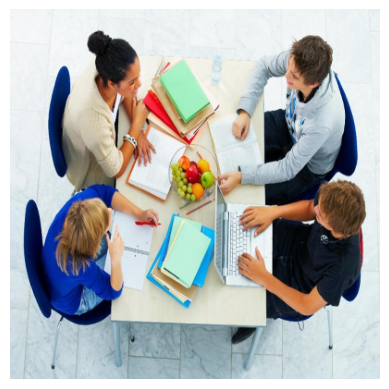

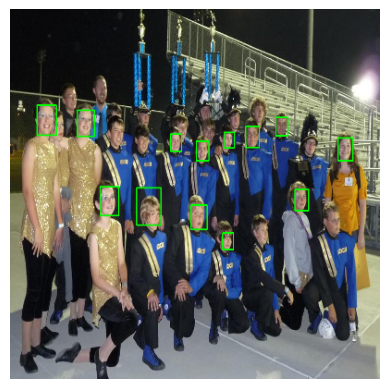

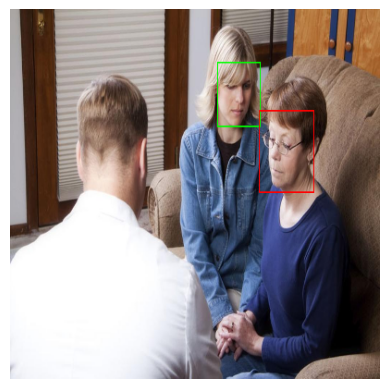

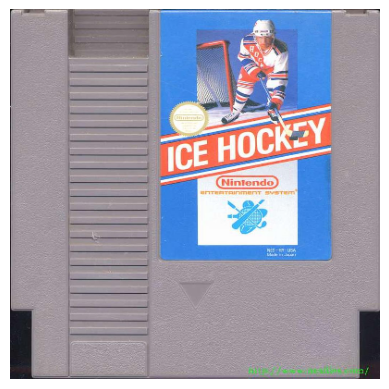

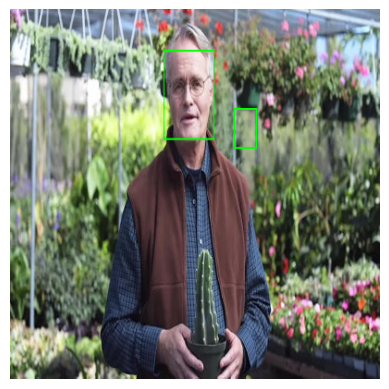

...

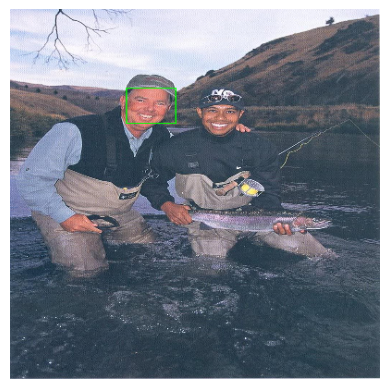

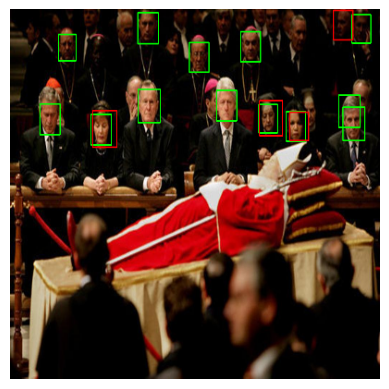

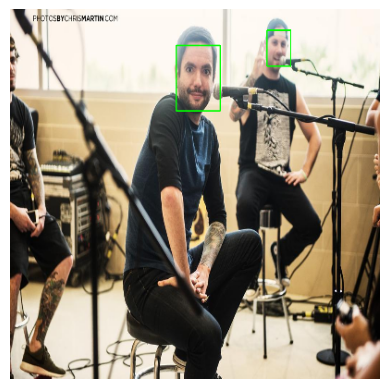

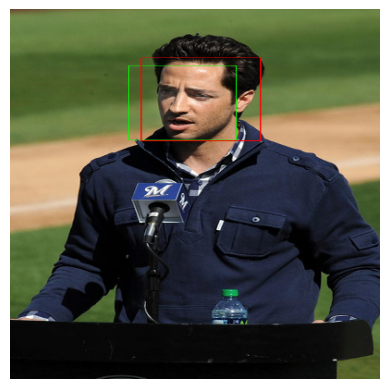

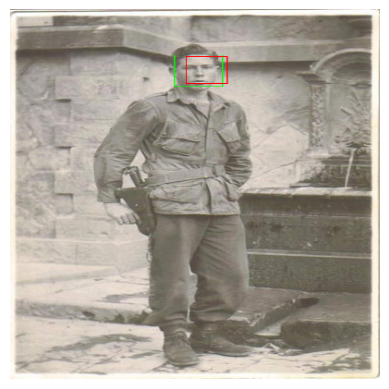

In [21]:
for folder in os.listdir(dataset_path):
    folder_path = os.path.join(dataset_path, folder)

    if os.path.isdir(folder_path):
        for img_name in os.listdir(folder_path):
            img_path = os.path.join(folder_path, img_name)

            img = cv2.imread(img_path)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            
            # Detect frontal faces
            faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=8, minSize=(10, 10))

            # Detect side faces
            side_profiles = profile_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=8, minSize=(10, 10))


            for (x, y, w, h) in faces:
                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

            for (x, y, w, h) in side_profiles:
                cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)

            # Display image with detected faces
            img_resized = cv2.resize(img, IMG_SIZE)
            plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
            plt.axis("off")
            plt.show()
            
            # Break after a few images for visualization
            break  

In [22]:
def detect_faces(image_path):
    # Read image
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Detect frontal and side faces
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=8, minSize=(30, 30))
    side_profiles = profile_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=8, minSize=(30, 30))

    # Draw bounding boxes
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green for frontal faces

    for (x, y, w, h) in side_profiles:
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 2)  # Red for side faces

    # Show image with detected faces
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

In [26]:
image_path = input("Enter the path of the image: ")
if os.path.exists(image_path):
    detect_faces(image_path)
else:
    print("Invalid file path. Please try again.")

Enter the path of the image:  ./Datasets/Train-Val/0--Parade/0_Parade_marchingband_1_5


Invalid file path. Please try again.
